## Uvod
Klasifikacija je osnovni zadatak u području mašinskog učenja koji se koristi za razvrstavanje podataka u različite kategorije ili klase na osnovu njihovih karakteristika. Matematički gledano, ulaz u procesu klasifikacije predstavljaju uređene n-torke parametara, dok izlaz predstavlja oznaku
klase. Cilj klasifikacije je izgraditi model koji će biti sposoban da razlikuje i generalizuje uzorke iz ulaznih podataka kako bi se pridružile odgovarajuće oznake ili kategorije novim, nepoznatim podacima. Klasifikacija spada u nadgledano mašinsko učenje s obzirom da zahteva trening skup podataka sa odgovarajućim oznakama ili klasama koje model koristi za učenje. Klasifikacija slika je specifična vrsta klasifikacije koja se fokusira na klasifikaciju slika u određene kategorije. U ovom slučaju, ulazni podaci su slike, a cilj je dodeliti svakoj slici odgovarajuću klasu ili oznaku na osnovu njenih vizuelnih karakteristika. Ovo je izuzetno važan problem sa širokom primenom, kao što je prepoznavanje objekata na slikama, detekcija lica, analiza medicinskih snimaka, prepoznavanje znakova i još mnogo toga.

Postoji nekoliko pristupa klasifikaciji slika u mašinskom učenju. Jedna od najčešće korišćenih metoda je metoda zasnovana na karakteristikama. U ovoj metodi, slike se prvo pretvaraju u vektore karakteristika koji se koriste za obuku klasifikatora. Karakteristike mogu biti različiti atributi koji se izračunavaju iz slika, kao što su histogrami boja, teksture, ivice ili Gabor filteri. Nakon izračunavanja karakteristika, primenjuje se neki od algoritama mašinskog učenja, kao što je logistička regresija, podržani vektori (eng. *Support vector networks*) ili neuronske mreže, kako bi se izvršila klasifikacija slika.


# Dataset

U ovom projektu, korišćen je skup podataka koji sadrži fotografije pasa, a cilj je bio klasifikovati pse prema njihovim rasama. Slike pasa su raspoređene u dva foldera: train i test. U folderu train se nalazi skup slika koje su korišćene za obuku modela, dok se u folderu test nalazi skup slika na kojima je model testiran. Skup podataka ne uključuje samo slike pasa, već i dva CSV fajla koja pružaju dodatne informacije o tim slikama. Prvi fajl se naziva labels i sadrži informacije o svakoj slici, kao što su ID slike i rasa pasa (eng. *breed*) kojoj pripada. Drugi CSV fajl, sample_submissions, definiše očekivani format izlaza koji treba generisati program. Ovaj fajl sadrži identifikacione brojeve slika iz testnog skupa i polja sa predefinisanim,generičkim vrednosti predviđanja za pojedinačne rase pasa. Ove predefinisane vrednosti predstavljaju privremenu vrednost za predviđanja koje treba generisati programom. Na kraju, ove vrednosti će biti zamenjene sa stvarnim predviđanjima koje će predstavljati izlaz iz algoritma klasifikacije slika pasa.

U izradi projekta, odabrani su algoritmi ResNet50V2 i InceptionV3. Oba algoritma su poznata i često korišćena rešenja u oblasti klasifikacije slika, sa dokazanom efikasnošću i visokom tačnošću. Na kraju,biće dat i kratak pregled porređenja performansi ova dva algoritma.




# Biblioteke

Na početku izrade projektnog zadatka, neophodno je bilo najpre importovati određene biblioteke koje će biti korišćene za dalju izradu projekta. Ove biblioteke pružaju različite funkcionalnosti za obradu slika, vizualizaciju podataka, manipulaciju fajlovima i rad sa neuronskim mrežama. Primera radi, TensorFlow je popularna biblioteka za mašinsko učenje koja se često koristi za izradu neuronskih mreža, Pandas je biblioteka koja pruža alate za manipulaciju i analizu podataka, Matplotlib omogućava vizualizaciju podataka putem grafika,dok cv2 omogućava obradu slika, uključujući manipulaciju slikama, detekciju objekata, promene boja i još mnogo toga.


In [1]:
import cv2
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image
from PIL import ImageFile
from IPython.display import display
import glob
import tensorflow as tf
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Učitavanje seta podataka

Nakon definisanja potrebnih biblioteka,sledi učitavanje spomenutog seta podataka koji je korišćen u okviru izrade ovog projekta,te nakon toga njegovo raspakivanje. Najpre, zipovani set podataka se preuzima korišćenjem alata wget. Konkretno, wget se koristi za preuzimanje ZIP arhive pod nazivom Dog_Classification.zip sa Google Drive-a. Komanda takođe koristi privremeni fajl tmp/cookies.txt za upravljanje kolačićima i potvrdu preuzimanja. Nakon preuzimanja, kolačići se uklanjaju. Nakon toga, pomoću komande unzip vrši se raspakivanje preuzetog ZIP fajla. Opcija -q se koristi za tiho raspakivanje,koje podrazumeva da se izlazne poruke ne generišu. Ova opcija je korišćena s ciljem kako bi se izbeglo generisanje izlazne poruke za svaku od slika u okviru dataseta, te na taj način pružila bolja preglednost notebook-a. Nakon izvršavanja ove komande, sadržaj ZIP arhive je dostupan za dalju obradu.*italicized text*


In [2]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=13nk1DfHBDu-BKnoE07bKm2F2CZVrQvS5' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=13nk1DfHBDu-BKnoE07bKm2F2CZVrQvS5" -O Dog_Classification.zip && rm -rf /tmp/cookies.txt


--2023-07-06 11:37:55--  https://docs.google.com/uc?export=download&confirm=t&id=13nk1DfHBDu-BKnoE07bKm2F2CZVrQvS5
Resolving docs.google.com (docs.google.com)... 74.125.200.100, 74.125.200.138, 74.125.200.101, ...
Connecting to docs.google.com (docs.google.com)|74.125.200.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-0o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uak1j2mj3lgf6eoe3avbcp9t1soq7vc5/1688643450000/06564548864299628332/*/13nk1DfHBDu-BKnoE07bKm2F2CZVrQvS5?e=download&uuid=e9407044-6c81-478f-990a-2edefa5cd584 [following]
--2023-07-06 11:37:55--  https://doc-00-0o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/uak1j2mj3lgf6eoe3avbcp9t1soq7vc5/1688643450000/06564548864299628332/*/13nk1DfHBDu-BKnoE07bKm2F2CZVrQvS5?e=download&uuid=e9407044-6c81-478f-990a-2edefa5cd584
Resolving doc-00-0o-docs.googleusercontent.com (doc-00-0o-docs.googleusercontent.com)... 74.125.24.132, 2

In [3]:
!unzip -q Dog_Classification.zip


Ova funkcija seed se koristi za postavljanje seed-a za generatore slučajnih brojeva u Pythonu. Kada se funkcija pozove, vrši se postavljanje seed-a za Pythonov generator slučajnih brojeva, što osigurava da se generišu isti slučajni brojevi pri svakom pokretanju programa.  Takođe, postavlja se seed za hash-ovanje u Pythonu, što obezbeđuje doslednost u hash-ovanju podataka. Dodatno, seed se postavlja i za NumPy generator slučajnih brojeva.

In [4]:
def seed(seed=1234):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
seed(42)

# Pregled i analiza podataka

Ovo poglavlje se odnosi na razumevanje, pripremu i vizualizaciju učitanog skupa podataka kako bi se stekao uvid u karakteristike podataka i identifikovali eventualni problemi. Cilj pregleda i analize podataka je sticanje dubljeg razumevanja skupa podataka koji će biti kasnije korišćen za treniranje i evaluaciju modela.

Najpre,vrši se definisanje putanja do direktorijuma koji sadrže trening i test podatke, kao i učitavanje CSV fajlova,o kojima je već bilo reči i koji sadrže informacije o oznakama trening skupa i uzorcima željenog izlaza koji program treba da generiše. CSV fajlovi se učitavaju u DataFrame-ove kako bi se podaci strukturirali i mogli koristiti za dalju analizu. DataFrame-ovi omogućavaju pristup podacima u tabelarnom obliku, što olakšava rad sa njima.

In [5]:
train_data = '/content/train'
test_data = '/content/test'

train_labels = pd.read_csv('/content/labels.csv')
submission=pd.read_csv('/content/sample_submission.csv')

Sledeća ćelija ima za cilj da prikaže informacije o broju slika u trening skupu podataka i kako se te slike podudaraju sa brojem oznaka slika navedenih u CSV fajlu koji sadrži oznake. Ovo je koristan pregled kako bi se već u startu proverilo da li broj slika i oznaka odgovaraju jedan drugome, što je važno za dalju obradu i obuku modela.

In [6]:
print("Iz train foldera se učitava ", len(os.listdir(train_data)), "slika koje se podudaraju sa ", len(train_labels), "oznaka.")

Iz train foldera se učitava  10222 slika koje se podudaraju sa  10222 oznaka.


Narednom ćelijom, vrši se poziv metode info() nad učitanim DataFrame-om koji sadrži oznake klasa za svaku od slika. Metoda info() pruža neke uopštene informacije o strukturi DataFrame-a, kao što su broj redova, broj kolona, tipovi podataka u kolonama i broj null vrednosti. Ova metoda se koristi za brz pregled strukture podataka i identifikaciju eventualnih nedostajućih vrednosti ili problematičnih tipova podataka. Kao što možemo videti u izlazu, DataFrame ima 10222 reda i 2 kolone - id i breed. Obe kolone su tipa object, što znači da su interpretirane kao stringovi. Takođe, još jedna bitna stvar, na koju je potrebno obratiti pažnju jesu nedostajuće vrednosti. Kao što se može videti,nema nedostajućih vrednosti u DataFrame-u.

In [7]:
train_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


Fukcijom head(),koja je korišćena u okviru ove ćelije, vrši se prikazivanje prvih 10 redova(po defaultu,ukoliko se ne prosledi vrednost, prikazuje se 5 redova) gore spomenutog DataFrame-a. Ova celija nam omogućava da pogledamo uzorak podataka i steknemo uvid u strukturu i format podataka, pre nego što nastavimo sa daljom analizom i obradom.

Prikazivanje prvih nekoliko redova DataFrame-a je korisno kako bismo se upoznali sa strukturom podataka i proverili da li su podaci pravilno učitani. Takođe nam omogućava da steknemo opšti uvid u sadržaj kolona.

In [8]:
train_labels.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


Naredna ćelija prikazuje broj jedinstvenih rasa pasa koje su prisutne u učitanom DataFrame-u. Korišćenje train_labels.breed.unique() vraća niz koji sadrži sve jedinstvene vrednosti iz kolone breed DataFrame-a train_labels.Nakon toga, pomoću funkcije len se računa dužina tog niza, odnosno broj jedinstvenih rasa pasa. Na ovaj način,možemo vidimo koliko različitih rasa pasa se nalazi u skupu podataka. Konkretno, pokretanjem ove ćelije, dobijamo informaciju da u ovom skupu podataka postoji ukupno 120 jedinstvenih rasa pasa.

In [9]:
print("Broj rasa pasa prisutnih u skupu podataka: ",len(train_labels.breed.unique()))

Broj rasa pasa prisutnih u skupu podataka:  120


Naredne 3 ćelije koda služe za proveru raspodelu slika,odnosno broja pojavljivanja slika po različitim klasama rasa pasa u skupu podataka. Najpre, podaci se grupišu prema koloni breed i izračunava se broj slika za svaku rasu. Rezultati su sortirani u opadajućem redosledu prema broju slika pomoću metode sort_values. Provera raspodele slika po klasama je važna jer nam pruža uvid u balansiranost skupa podataka. Ako imamo nejednaku raspodelu slika među klasama, to može uticati na performanse modela tokom obuke. Neravnoteža u broju slika može dovesti do pristranosti modela prema češćim klasama, dok manje zastupljene klase mogu biti nedovoljno naučene. Na kraju prve ćelije pozvana je funkcije head, te samo pokretanje ove ćelije,pored grupisanaj i sortiranja,ima za za cilj da prikaže i prvih 10 najčešćih klasa pasa zajedno sa brojem slika koje pripadaju tim klasama.

In [10]:
breeds_occurrences = train_labels.groupby("breed").count()
breeds_occurrences = breeds_occurrences.rename(columns={"id": "count"})
breeds_occurrences = breeds_occurrences.sort_values("count", ascending=False)
breeds_occurrences.head(10)

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
shih-tzu,112
great_pyrenees,111
pomeranian,111
basenji,110


Slično kao i u prethodnoj ćeliji, ovde se takođe vrši prikazivanje prethodno kreiranog DataFrame-a breeds_occurrences, ali umesto prvih 10 klasa, ovde se prikazuje poslednjih 10 klasa rasa pasa sa najmanjim brojem slika.

In [11]:
breeds_occurrences.tail(10)

,count
breed,
tibetan_mastiff,69
german_shepherd,69
giant_schnauzer,69
walker_hound,69
otterhound,69
golden_retriever,67
brabancon_griffon,67
komondor,67
briard,66


Kao što možemo videti iz prethodne dve ćelije, postoji velika razlika. Najzastupljenije klase pasa u setu podataka imaju gotovo dvostruko više slika u poređenju sa najmanje zastupljenim klasama. To otvara pitanje da li je smanjenje broja slika po klasama odvija postepeno (kontinuirano) ili se dešava skokovito. U cilju pružanja odgovora na ovo pitanje, izrađen je bar dijagram koji prikazuje raspodelu broj slika za svaku rasu pasa. Na horizontalnoj osi se nalazi broj slika od najvećeg do najmanjeg, dok se na vertikalnoj osi nalaze nazivi rasa pasa. Na osnovu prikazanog grafikona distribucije koji predstavlja rezultat izvršavanja naredne ćelije, možemo primetiti da smanjenje količine slika po rasi ima kontinuirani karakter. To znači da se brojnost slika postepeno smanjuje kako se prelazi sa najzastupljenijih na najmanje zastupljene rase pasa.

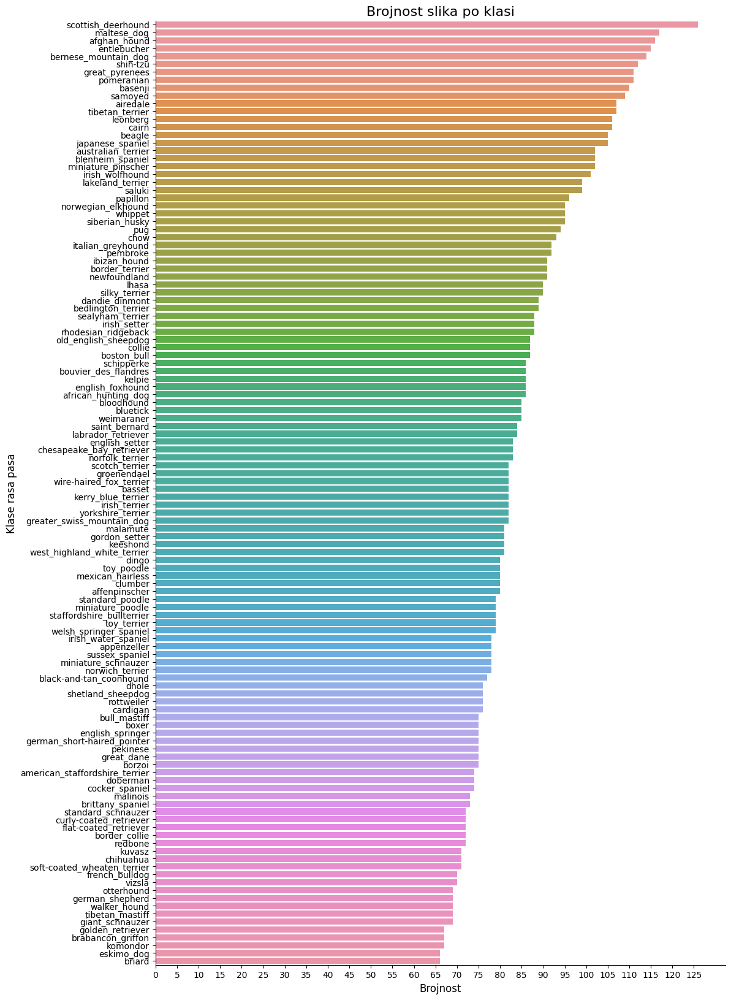

In [12]:
counts = train_labels["breed"].value_counts()
plt.figure(figsize=(12, 20))
ax = sns.barplot(x=counts.values, y=counts.index)

plt.title("Brojnost slika po klasi", fontsize=16)
plt.xlabel("Brojnost", fontsize=12)
plt.ylabel("Klase rasa pasa", fontsize=12)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xticks(np.arange(0, 130, 5), fontsize=10)
plt.yticks(fontsize=10)

plt.show()

Rezolucija slike se odnosi na broj piksela koji čine sliku i predstavlja jednu od najvažnijih karakteristika slike. Kada koristimo transfer learning, često je potrebno prilagoditi veličinu slika kako bi se uskladile sa zahtevima samog modela neuronske mreže. Većina prethodno obučenih modela ima određene očekivane dimenzije ulaznih slika, koje su definisane prilikom obuke modela. Ukoliko se naši trening podaci razlikuju po rezoluciji od očekivane rezolucije modela, tada je neophodno prilagoditi veličinu slika. Narednih nekoliko ćelija imaju za cilj pregled i analizu slika u trening skupu podataka, a posebno njihovih rezolucija. Ovo omogućava sticanje uvida u u to kakve su slike u datasetu i pomaže prilikom donošenja odluka o daljoj obradi podataka. Ova analiza nam pruža uvid u broj slika sa određenom rezolucijom i pomaže nam da razumemo raznolikost rezolucija koje se javljaju u skupu podataka. U prvoj od nekoliko narednih ćelija, najpre prolazimo kroz sve slike koje se nalaze u trening direktorijumu i za svaku sliku izračunavamo visinu i širinu pomoću OpenCV biblioteke.

In [13]:
image_sizes = []
for filename in os.listdir(train_data):
    image_path = os.path.join(train_data, filename)
    image = cv2.imread(image_path)
    height, width, _ = image.shape
    image_sizes.append([height, width])

image_sizes = np.array(image_sizes, dtype=np.int)

U narednoj ćeliji, definiše se i koristi funkcija remove_outliers koja uklanja outlier-e,odnosno ekstremne vrednosti iz podataka o rezoluciji slika.  Ova funkcija koristi statističku metodu izračunavanja modificiranih Z-skorova kako bi se identifikovali izuzeci na osnovu odstupanja od medijane i medijane apsolutnih odstupanja. U ovom slučaju, koristimo prag od 2.5 da bismo odredili koji podaci se smatraju izuzecima. Nakon uklanjanja izuzetaka, izračunava se maksimalna, srednja i minimalna visina i širina preostalih podataka. Cilj uklanjanja outlier-a je da izbegnemo negativan uticaj ekstremnih vrednosti na statističke analize. Uklanjanjem ekstremnih vrednosti možemo dobiti bolji uvid u raspon i prosečne vrednosti rezolucije slika, bez preteranog uticaja ekstremnih vrednosti koje mogu narušiti rezultate analize.

In [14]:
def remove_outliers(data, threshold=2.5):
    median = np.median(data)
    median_deviation = np.median(np.abs(data - median))
    modified_z_scores = 0.6745 * (data - median) / (median_deviation if median_deviation else 1.0)
    return data[modified_z_scores < threshold]

heights = remove_outliers(image_sizes[:, 0])
widths = remove_outliers(image_sizes[:, 1])

max_height = np.max(heights)
mean_height = np.mean(heights)
min_height = np.min(heights)

max_width = np.max(widths)
mean_width = np.mean(widths)
min_width = np.min(widths)

print("width: Max {}, Mean {}, Min {}".format(max_width,mean_width,min_width))
print("hight: Max {}, Mean {}, Min {}".format(max_height,mean_height,min_height))

width: Max 503, Mean 426.39508448540704, Min 97
hight: Max 530, Mean 373.83504531722053, Min 102


Izvršavanjem koda u narednoj ćeliji vrši se vizualni prikaz raspodele visina i širina slika. Prvo se visine i širine konvertuju u listu, sortiraju se u rastućem redosledu, a zatim se koristi sns.histplot funkcija iz biblioteke Seaborn za iscrtavanje histograma.Na levoj strani grafika se prikazuje raspodela visina slika, dok se na desnoj strani grafika prikazuje raspodela širina slika. Oba grafika imaju oznake osa: Height za visine i Width za širine. Takođe, postavljena je oznaka Density za ose koje predstavljaju gustinu raspodele. Ova analiza je korisna jer nam pruža uvid u raznolikost rezolucija slika. Možemo primetiti koje rezolucije su najzastupljenije i kako se raspodele visina i širina međusobno razlikuju. Na osnovu kreiranih grafikona možemo primetiti da je širina slika uglavnom konstantna i da iznosi oko 500 piksela, dok visina ima raspon od 250 do 500 piksela,ne uzimajući u obzir ekstremne vrednosti. Vizuelnim pregledom slika u dataset-u, može se pretpostaviti da je glavni uzrok razuđene raspodele visine slika njihova orijentacija. Neke od slika su okrenute horizontalno, dok su druge okrenute vertikalno. Na osnovu raspodele, možemo uopšteno zaključiti da većina slika ima odnos širine i visine 1:2, odnosno da je većina slika u režimu pejzaža/portreta.

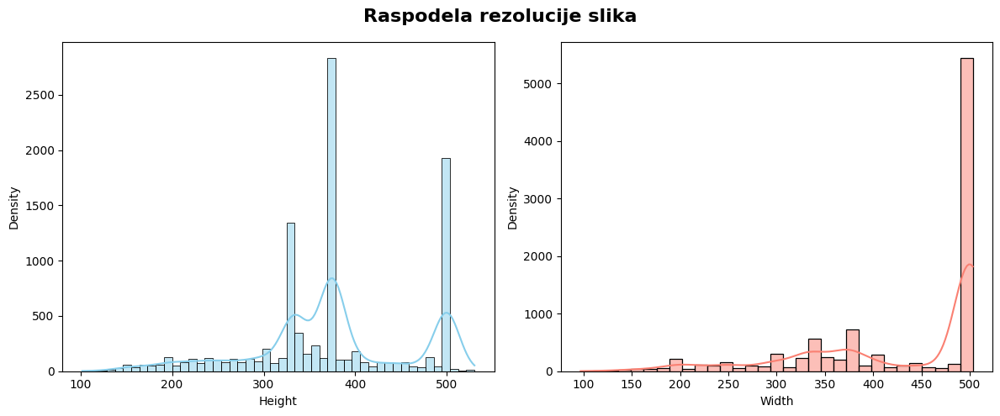

In [15]:
heights = heights.astype(np.int).tolist()
heights.sort()

plt.figure(figsize=(12, 5))

plt.subplot(121)
plt.xlabel("Height")
plt.ylabel("Density")
sns.histplot(heights, kde=True, color='skyblue')

widths = widths.tolist()
widths.sort()

plt.subplot(122)
plt.xlabel("Width")
plt.ylabel("Density")
sns.histplot(widths, kde=True, color='salmon')

plt.suptitle("Raspodela rezolucije slika", fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()


U prethodnim ćelijama smo analizirali podatke kako bismo dobili statistički uvid u raspodelu rezolucija slika. Sada, kroz vizuelni pregled nasumično odabranih slika iz trening seta, možemo se direktno uveriti u te karakteristike i dobiti intuitivniju predstavu o datasetu. U zavisnosti od toga koje nasumične slike se odaberu prilikom izvršavanja ove ćelije,mogu se primetiti različite stvari kao što su to da su,kao što je već spomenuto,neke slike okrenuto vertikalno, neke horizontalno, zatim može se uočiti prisustvo ljudi ili drugih objekata zajedno sa psima na slikama, kao i to da neke slike prikazuju više pasa istovremeno. Dodatno, primećuje se da slike u trening setu imaju različite veličine, što se slaže sa rezultatima prikazanim na prethodno kreiranim grafikonima.

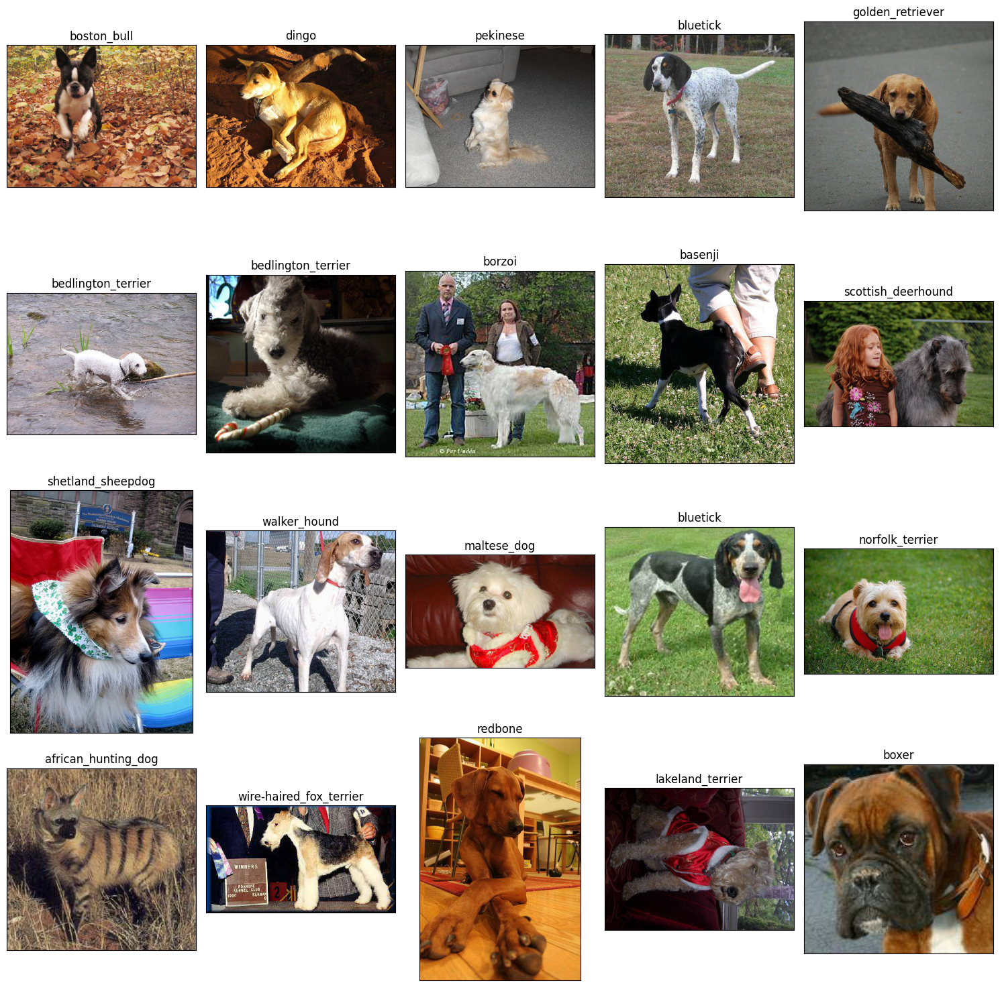

In [16]:
path_img=[]
data_df = pd.DataFrame()
for i in range(len(train_labels["id"])):
    temp=  "/content/train/" + str(train_labels.id[i]) + ".jpg"
    path_img.append(temp)

data_df['path_img'] =path_img
data_df.head()
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data_df.path_img[i]))
    ax.set_title(train_labels.breed[i])
plt.tight_layout()
plt.show()

U narednoj ćeliji, dodaje se nova kolona path u okviru DataFrame-a train_labels. Ova nova kolona sadrži putanje do slika koje se nalaze u trening skupu podataka. Kombinuje se vrednost kolone id,koja sadrži ime slike, sa ekstenzijom .jpg kako bi se dobila puna putanja do slike. Ovaj korak je bitan jer se u narednim delovima projekta koristi ImageDataGenerator za generisanje učitanih slika tokom obuke modela. ImageDataGenerator očekuje putanje do slika kao ulaz, pa se koristi ta nova kolona path koja sadrži punu putanju do slika.

In [17]:
train_labels['path'] = train_labels['id'] + '.jpg'

# Klasifikacija korišćenjem InceptionV3 modela
Klasifikacija korišćenjem InceptionV3 modela predstavlja jedan od pristupa dubokom učenju za rešavanje problema klasifikacije slika. InceptionV3 je arhitektura konvolucijske neuronske mreže koja je razvijena od strane Google Brain tima. InceptionV3 model koristi konvolucione neuronske mreže (CNN) koje omogućavaju efikasno izdvajanje feature-a iz slika. Arhitektura InceptionV3 modela se sastoji od složenog skupa slojeva koji se međusobno povezuju i obrađuju ulazne slike. Ovi slojevi obuhvataju konvolucione slojeve, slojeve sažimanja, konkatenaciju,dropout i potpuno povezane slojeve. Batch normalizacija se intenzivno koristi u modelu i primenjuje se na aktivacijske ulaze. Gubitak se računa koristeći Softmax funkciju. Prikaz arhitekture InceptionV3 dat je na slici ispod. InceptionV3 model je obučen na velikom skupu podataka, kao što je ImageNet, koji sadrži milione slika podeljenih u hiljade različitih klasa. Tokom obuke, InceptionV3 model je naučio da prepoznaje različite objekte i obrasce na slikama, što ga čini sposobnim za klasifikaciju novih slika na osnovu naučenih obrazaca. On je pokazao tačnost veću od 78,1% na ImageNet skupu podataka. Kada se koristi InceptionV3 model za klasifikaciju, ulazna slika se prosleđuje kroz mrežu, prolazi kroz različite slojeve konvolucije, grupne normalizacije, aktivacije i slojeve sažimanja. Na kraju, izlazni sloj daje verovatnoćnosti za svaku od mogućih klasa.
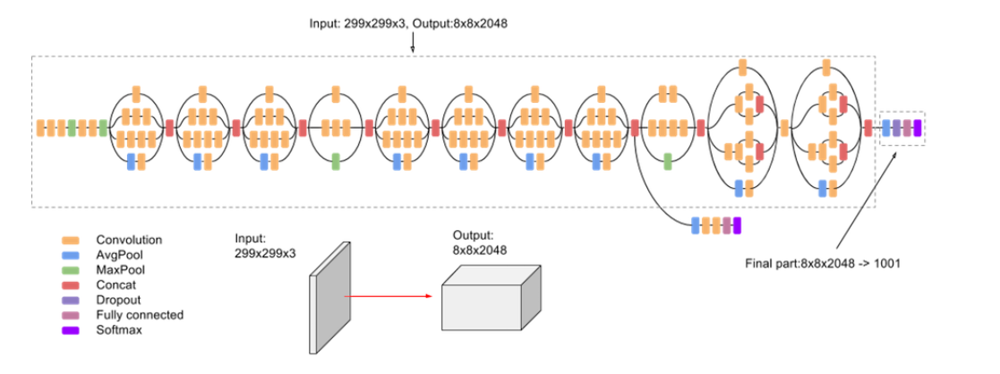

# Podešavanje seta podataka i augmentacija
InceptionV3 model očekuje ulazne slike određenih dimenzija. Konkretno, model očekuje ulazne slike veličine 299x299 piksela. To znači da je potrebno da sve slike budu skalirane na rezoluciji odgovarajuću toj dimenziji pre nego što se proslede modelu. Osim dimenzija, InceptionV3 model očekuje da mu se ulazne slike normalizuju. Uobičajena praksa je da se ulazne slike normalizuju skaliranjem intenziteta piksela na raspon od 0 do 1. To se može postići deljenjem svake vrednosti piksela sa 255. Takođe, model očekuje da ulazne slike budu u RGB formatu. Da bi se to postiglo, koristi se ImageDataGenerator iz TensorFlow biblioteke kako bi generisali podaci. Pored toga, izvršena je i augmentacija,kako bi se izbeglo overfitovanje modela. Overfitovanje se javlja kada model previše "pamti" trening podatke i ne generalizuje dobro na novim, neviđenim podacima. Korišćenje augmentacije pomaže u stvaranju veće raznolikosti u trening skupu podataka, čime se model izlaže različitim varijacijama i perspektivama istih slika. To omogućava modelu da nauči opšte karakteristike slika umesto da se previše fokusira na specifične detalje trening skupa. Kao što se može videti u kodu ispod,nad slikama su izvrešene različite transformacije, kao što su horizontalno rotiranje, smicanje,rotacija, zumiranje, pomeranje i promena osvetljenja. Nakon konfigurisanja ImageDataGenerator-a, koristi se metoda flow_from_dataframe za generisanje podataka za trening i validaciju,s tim da se za validaciju koristi 10% od ukupnog seta za trening.

In [18]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0 / 255,
    horizontal_flip=True,
    shear_range=0.2,
    validation_split=0.1,
    rotation_range=15,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.8, 1.2]
)
train = datagen.flow_from_dataframe(train_labels,
                                    directory=train_data,
                                    x_col='path',
                                    y_col='breed',
                                    subset='training',
                                    color_mode = 'rgb',
                                    shuffle=False,
                                    class_mode="categorical",
                                    target_size=(299,299),
                                    batch_size=32,
                                    seed=123)

val = datagen.flow_from_dataframe(train_labels,
                                  directory=train_data,
                                  x_col='path',
                                  y_col='breed',
                                  subset='validation',
                                  color_mode = 'rgb',
                                  shuffle=False,
                                  class_mode="categorical",
                                  target_size=(299, 299),
                                  batch_size=32,
                                  seed=123)

Found 9200 validated image filenames belonging to 120 classes.
Found 1022 validated image filenames belonging to 120 classes.


Sledeća ćelija se koristi za dobijanje mapiranja između naziva klasa i njihovih odgovarajućih indeksa. U ćeliji nakon nje,svaki ključ-vrednost par u rečniku se zamenjuje obrnutim redosledom, tako da sada mapira indekse na nazive klasa.Ovo nam omogućava da kasnije jednostavno dekodiramo izlazne vrednosti modela i dobijemo razumljive nazive klasa umesto brojeva. Na taj način, možemo da interpretiramo rezultate modela i identifikujemo kojoj klasi pripada svaki izlazni rezultat.

In [19]:
classes = train.class_indices

In [20]:
classes = {x: y for y, x in classes.items()}
classes

{0: 'affenpinscher',
 1: 'afghan_hound',
 2: 'african_hunting_dog',
 3: 'airedale',
 4: 'american_staffordshire_terrier',
 5: 'appenzeller',
 6: 'australian_terrier',
 7: 'basenji',
 8: 'basset',
 9: 'beagle',
 10: 'bedlington_terrier',
 11: 'bernese_mountain_dog',
 12: 'black-and-tan_coonhound',
 13: 'blenheim_spaniel',
 14: 'bloodhound',
 15: 'bluetick',
 16: 'border_collie',
 17: 'border_terrier',
 18: 'borzoi',
 19: 'boston_bull',
 20: 'bouvier_des_flandres',
 21: 'boxer',
 22: 'brabancon_griffon',
 23: 'briard',
 24: 'brittany_spaniel',
 25: 'bull_mastiff',
 26: 'cairn',
 27: 'cardigan',
 28: 'chesapeake_bay_retriever',
 29: 'chihuahua',
 30: 'chow',
 31: 'clumber',
 32: 'cocker_spaniel',
 33: 'collie',
 34: 'curly-coated_retriever',
 35: 'dandie_dinmont',
 36: 'dhole',
 37: 'dingo',
 38: 'doberman',
 39: 'english_foxhound',
 40: 'english_setter',
 41: 'english_springer',
 42: 'entlebucher',
 43: 'eskimo_dog',
 44: 'flat-coated_retriever',
 45: 'french_bulldog',
 46: 'german_sheph

U narednoj ćeliji se nasumično bira 8 slika iz prethodno generisanog trening dela podataka. Ove nasumično izabrane slike se zatim prikazuju u obliku mreže sa 2 reda i 4 kolone, koristeći subplots funkciju. Pomoću ovog vizuelnog prikaza slika, pre nego što nastavimo sa treniranjem modela, proveravamo da li su slike pravilno učitane, da li su različite augmentacije uspešno primenjene na slike, kao i to da li su slike u trening setu sada istih dimenzija.  

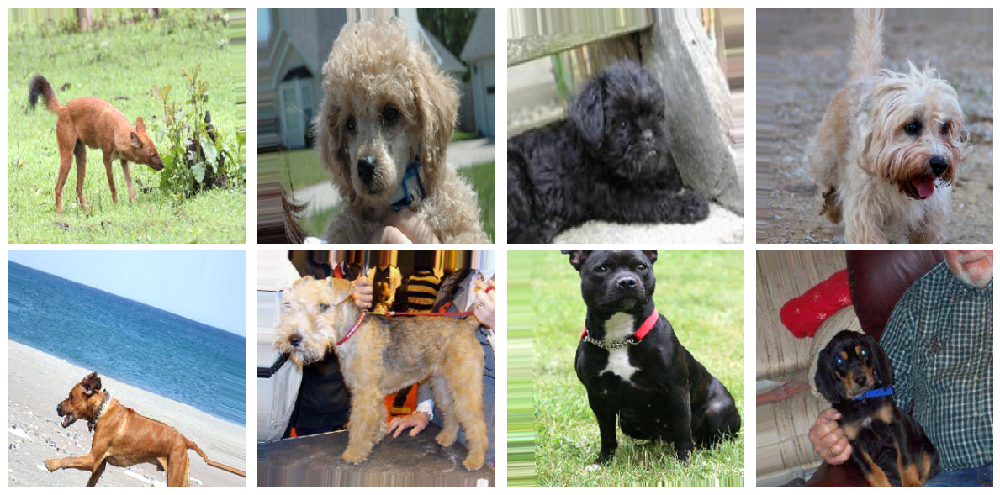

In [21]:
image_batch, label_batch = train.next()

random_indices = random.sample(range(image_batch.shape[0]), 8)
random_images = image_batch[random_indices]

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.ravel()

for i, image in enumerate(random_images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Kreiranje modela
U narednoj ćeliji se kreira model za klasifikaciju koristeći InceptionV3 arhitekturu kao osnovu. Prvo se kreira instanca InceptionV3 modela pozivom `tf.keras.applications.inception_v3.InceptionV3()` funkcije. U ovom koraku, specificira se da se učitaju prethodno naučene težine modela sa ImageNet dataset-a, kako bi se iskoristilo već postignuto znanje o ekstrakciji karakteristika iz slika. Takođe se postavlja i očekivani ulazni oblik slika (299x299x3). Parametar include_top je postavljen na False kako bismo uklonili poslednji sloj mreže koji je odgovoran za klasifikaciju,te da bismo umesto njega dodali sopstvene slojeve za klasifikaciju. Dodavanje sopstvenog klasifikatora nam omogućava da prilagodimo model specifičnim zahtevima našeg problema, umesto da koristimo univerzalni klasifikacioni sloj koji dolazi sa prethodno obučenim modelom. Nakon toga, vrši se zamzrzavanje svih slojeva,čime se onemogućava treniranje tih slojeva tokom faze obučavanja našeg modela.  Nakon toga, kreira se sekvencijalni model, sa InceptionV3 modelom kao početnom tačkom. Nakon InceptionV3 sloja, dodaju se dodatni slojevi koji se prilagođavaju našem problemu klasifikacije. Prvi dodatni sloj je sloj Flatten, koji pretvara izlaze iz prethodnog sloja u jednodimenzionalni vektor. Zatim sledi potpuno povezan sloj sa 512 neurona, koji koristi ReLU aktivacionu funkciju. Nakon toga se dodaje sloj Dropout, koji služi za prevenciju overfitting-a tako što isključuje nasumične neurone tokom treninga. Zatim se dodaje još jedan potpuno povezan sloj sa 256 neurona i ReLU aktivacionom funkcijom. Ponovo se dodaje sloj Dropout. Na kraju, dodaje se izlazni sloj sa 120 neurona, koji koristi softmax aktivacionu funkciju za predviđanje verovatnoće za svaku od 120 mogućih klasa.

In [22]:
inceptionV3 = tf.keras.applications.inception_v3.InceptionV3(include_top = False,
                                           weights      = 'imagenet',
                                           input_shape = (299,299,3))

inceptionV3.trainbale = False
for layer in inceptionV3.layers:
    layer.trainable = False


model = tf.keras.Sequential([
    inceptionV3,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512,activation ='relu'),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(256,activation ='relu'),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(120,activation = 'softmax')
])



87910968/87910968 [==============================] - 5s 0us/step


# Definisanje callback-ova
U ćeliji ispod, definiše se lista callback-ova koja će se koristiti tokom treniranja modela.Prvi definisani callback je EarlyStopping. On se koristi za rano zaustavljanje treninga ako se gubitak na validacionom skupu(eng. *val_loss*) prestane smanjivati nakon određenog broja epoha. U ovom slučaju, pratimo vrednost gubitka na validacionom skupu  i postavili smo da se trening zaustavi ako se gubitak ne smanjuje tokom 3 uzastopne epohe. Drugi definisani callback  je ReduceLROnPlateau. On se koristi za automatsko smanjivanje stope učenja (eng. *learning rate*) kada se preciznost validacije(eng. *val_accuracy*) prestane poboljšavati. Faktor smanjenja stope učenja je postavljen na 0.1,što znači da se stopa učenja smanjuje za 0.1, ako se preciznost ne poboljšava tokom 2 uzastopne epohe.

In [23]:
callbacks_list = [
    tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 3,verbose = 1),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy',factor=0.1,patience=2, min_lr=1e-7, verbose=1, mode="max" )
]


U narednoj ćeliji,najpre se kompajlira model sa odgovarajućim parametrima. Koristi se kategorička unakrsna entropija (eng. *categorical_crossentropy*) kao funkcija gubitka koja se često koristi za klasifikaciju više klasa, Adam optimizator za optimizaciju parametara modela, i accuracy kao metrika za evaluaciju performansi modela. Nakon kompajliranja, model se trenira kroz 10 epoha. To se postiže pozivom metode fit_generator, koja prima generator podataka za trening  i validaciju, kao i druge parametre koji definišu tok treniranja.

In [24]:
model.compile(loss = 'categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(),
              metrics   = ['accuracy'])

hist = model.fit_generator(generator = train,
                           epochs = 10,
                           steps_per_epoch  = train.n//train.batch_size,
                           validation_data  = val,
                           validation_steps = val.n//val.batch_size,
                           callbacks = callbacks_list)

Epoch 1/10
287/287 [==============================] - 318s 1s/step - loss: 3.9107 - accuracy: 0.3057 - val_loss: 1.4160 - val_accuracy: 0.6411 - lr: 0.0010
Epoch 2/10
287/287 [==============================] - 294s 1s/step - loss: 1.5504 - accuracy: 0.6287 - val_loss: 1.1559 - val_accuracy: 0.7147 - lr: 0.0010
Epoch 3/10
287/287 [==============================] - 279s 972ms/step - loss: 1.2435 - accuracy: 0.6840 - val_loss: 1.0172 - val_accuracy: 0.7258 - lr: 0.0010
Epoch 4/10
287/287 [==============================] - 279s 971ms/step - loss: 1.0612 - accuracy: 0.7229 - val_loss: 0.9855 - val_accuracy: 0.7369 - lr: 0.0010
Epoch 5/10
287/287 [==============================] - 292s 1s/step - loss: 0.9447 - accuracy: 0.7520 - val_loss: 0.9197 - val_accuracy: 0.7631 - lr: 0.0010
Epoch 6/10
287/287 [==============================] - 278s 970ms/step - loss: 0.8962 - accuracy: 0.7666 - val_loss: 0.9352 - val_accuracy: 0.7681 - lr: 0.0010
Epoch 7/10
287/287 [==============================] - 2

# Prikaz preciznosti i gubitka istreniranog modela
Naredna ćelija ima za cilj kreiranje grafika koji prikazuje metrike treninga i validacije tokom epoha treniranja modela. Sam grafik se sastoji od dva *subplota*.Prvi *subplot* prikazuje promene u vrednostima gubitka tokom treninga i validacije. Na x-osi se nalaze brojevi epoha, a na y-osi je prikazan gubitak. Linija plave boje predstavlja gubitak tokom treninga, dok linija zelene boje predstavlja gubitak tokom validacije. Slično tome,drugi *subplot*  prikazuje promene u vrednostima preciznosti tokom treninga i validacije. Na x-osi se nalaze brojevi epoha, a na y-osi je prikazana preciznost. Linija plave boje predstavlja preciznost tokom treninga, dok linija zelene boje predstavlja preciznost tokom validacije.

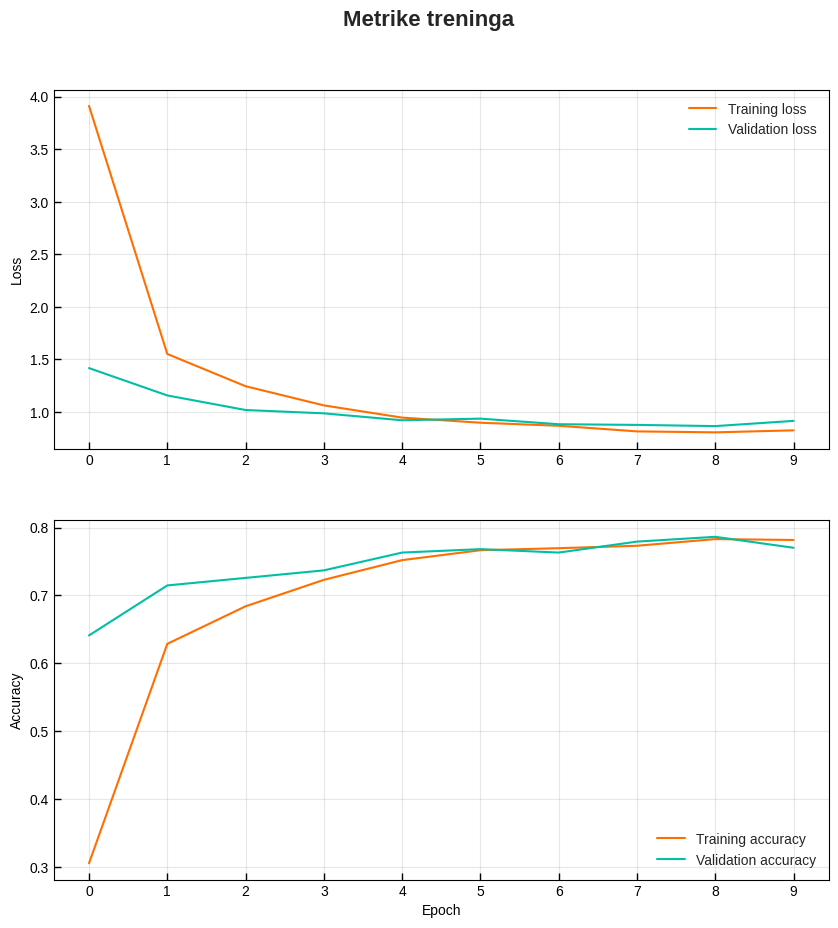

In [25]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

plt.style.use('seaborn-whitegrid')
colors = ['#FF6F00', '#00BFA5']


ax1.plot(hist.history['loss'], color=colors[0], label="Training loss")
ax1.plot(hist.history['val_loss'], color=colors[1], label="Validation loss")
ax1.set_xticks(np.arange(0, len(hist.history['loss']), 1))
ax1.set_ylabel('Loss')
ax1.legend(loc='upper right')

ax2.plot(hist.history['accuracy'], color=colors[0], label="Training accuracy")
ax2.plot(hist.history['val_accuracy'], color=colors[1], label="Validation accuracy")
ax2.set_xticks(np.arange(0, len(hist.history['accuracy']), 1))
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend(loc='lower right')

fig.suptitle('Metrike treninga', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=0.9)

ax1.grid(alpha=0.3)
ax2.grid(alpha=0.3)
ax1.tick_params(axis='both', which='both', direction='in', length=5, width=1, colors='black')
ax2.tick_params(axis='both', which='both', direction='in', length=5, width=1, colors='black')

plt.show()



#Evaluacija modela nad validacionim skupom podataka

U naredne dve ćelije vrši se evaluacija istreniranog modela nad evaluacionim skupom podataka. Najpre se, u prvoj ćeliji vrši predikcija nad validacionim skupom podataka koristeći obučeni model. Metoda predict se koristi za dobijanje predikcija za sve slike iz validacionog skupa. Zatim se primenjuje np.argmax funkcija sa argumentom axis=-1 kako bi se dobile indeksi klasa sa najvećim verovatnoćama za svaku sliku. Nakon toga,u drugoj ćeliji se kreira grafik koji prikazuje nasumično izabrane slike iz validacionog skupa, zajedno sa stvarnom i predviđenom klasom za svaku sliku.

In [26]:
validation_predictions = np.argmax(model.predict(val),axis=-1)

32/32 [==============================] - 36s 1s/step


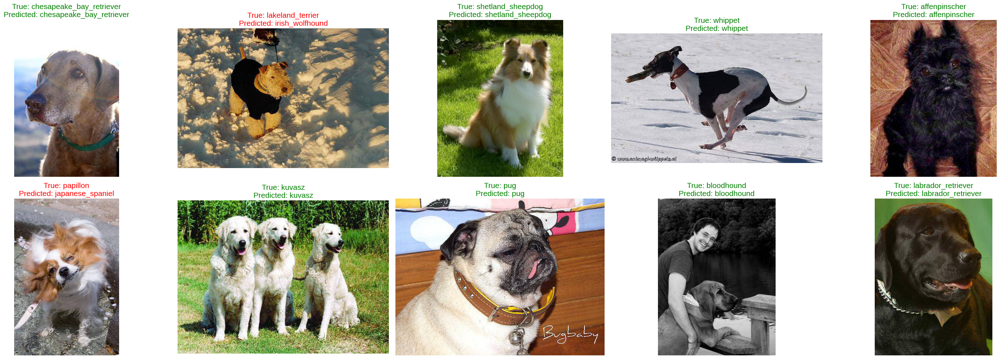

In [27]:
fig, axes = plt.subplots(2, 5, figsize=(30, 10))

for ax in axes.reshape(-1):
    rnd_idx = np.random.randint(0, len(val.filepaths))
    arr = plt.imread(val.filepaths[rnd_idx])
    ax.imshow(arr)
    breed_true = classes[val.classes[rnd_idx]]
    breed_pred = classes[validation_predictions[rnd_idx]]

    if breed_true != breed_pred:
        title_color = 'red'
    else:
        title_color = 'green'

    ax.set_title(f'True: {breed_true}\nPredicted: {breed_pred}', color=title_color, fontsize=15)
    ax.axis('off')

plt.tight_layout()
plt.show()


#Evaluacija modela nad testnim skupom podataka

Ova sekcija je posvećena evaluaciji modela nad testnim skupom podataka koja nam omogućava da dobijemo realnu procenu performansi modela na neviđenim podacima. Kada model treniramo i validiramo na trening i validacionom skupu podataka, može postojati rizik od overfitovanja, što znači da se model može dobro prilagoditi trening podacima, ali može imati lošu performansu na novim, neviđenim podacima. U narednoj ćeliji se najpre kreira lista breed koja sadrži nazive rasa koje se nalaze kao kolone u submission DataFrame-u. Zatim se dodaje nova kolona file_name koja se formira spajanjem vrednosti kolone id sa ekstenzijom .jpg, slično kao što je to rađeno i za trening skup podataka. Ova nova kolona sadrži putanju do slika testnog skupa podataka. Nakon toga koristi se ImageDataGenerator za generisanje podataka. Ovde se vrši samo normalizacija slika skaliranjem svih piksela na opseg od 0 do 1. Zatim se koristi test_gen.flow_from_dataframe metoda za generisanje podataka za evaluaciju. Metoda prima DataFrame objekat submission kao podatke, zadaje se direktorijum test_data u kojem se nalaze slike, kolona file_name se koristi kao putanja do slika, a za ciljne vrednosti se postavlja y_col=None jer u testnom skupu podataka nemamo informaciju o klasama,te se na ovaj način priprema testni skup podataka kako bi se mogla izvršiti evaluacija modela nad tim podacima.

In [28]:
breeds = submission.columns[1:].tolist()
submission['file_name'] = submission['id'] + '.jpg'
test_gen =  tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)

test = test_gen.flow_from_dataframe(submission,
                                    directory=test_data,
                                    x_col='file_name',
                                    y_col=None,
                                    color_mode = 'rgb',
                                    shuffle=False,
                                    class_mode=None,
                                    target_size=(299,299),
                                    batch_size=32,
                                    seed=123)

Found 10357 validated image filenames.


U okviru ćelije ispod, istrenirani model se koristi za izvršavanje predikcija nad testnim skupom podataka. Metoda predict se koristi za dobijanje verovatnoća predikcija za svaku klasu za svaki uzorak u testnom skupu. Zatim se funkcija argmax koristi za odabir indeksa klase sa najvećom verovatnoćom kao finalnu predikciju za svaki uzorak. Dakle, test_predictions_probabilities sadrži verovatnoće predikcija za svaku klasu, dok test_predictions sadrži indekse klasa sa najvećom verovatnoćom za svaki uzorak.

In [29]:
test_predictions_probabilities = model.predict(test)
test_predictions = np.argmax(test_predictions_probabilities, axis=-1)


324/324 [==============================] - 77s 233ms/step


Naredna ćelija ima za cilj da prikaže nasumično odabrane slike iz testnog skupa podataka, zajedno sa njihovim predikcijama i verovatnoćama. Za svaku sliku se nasumično bira indeks iz testnog skupa podataka. Zatim se slika učitava koristeći putanju do slike iz test.filepaths. Nakon toga, iz predikcija test_predictions se dobija predikcija za tu sliku, odnosno indeks klase sa najvećom verovatnoćom,te se na osnovu tog indeksa pronalazi naziv klase iz prethodno kreiranog rečnika classes. Takođe, iz test_predictions_probabilities se dobija maksimalna verovatnoća predikcije za tu sliku. Ovo nam omogućava vizuelnu proveru predikcija i verovatnoća na nasumično odabranim slikama iz testnog skupa podataka.

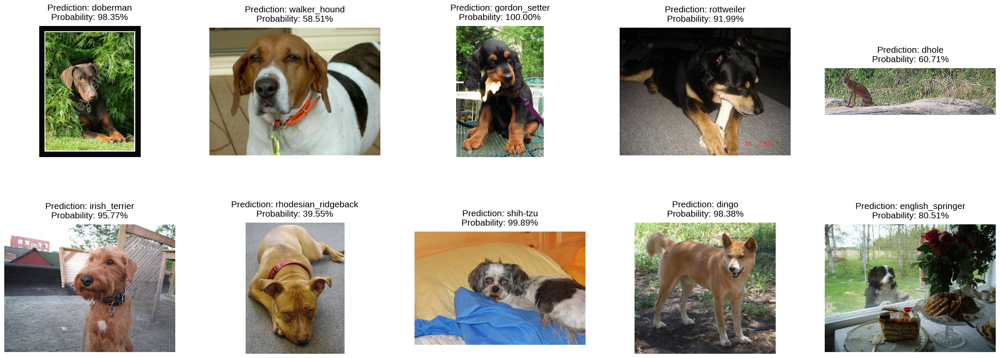

In [30]:
fig, axes = plt.subplots(2, 5, figsize=(30, 10), gridspec_kw={'hspace': 0.5})

for ax in axes.reshape(-1,):
    rnd_idx = np.random.randint(0, len(test.filepaths))
    arr = plt.imread(test.filepaths[rnd_idx])

    ax.imshow(arr)

    breed_pred = classes[test_predictions[rnd_idx]]
    max_prob = np.max(test_predictions_probabilities[rnd_idx])

    prob_percentage = max_prob * 100

    title_text = f'Prediction: {breed_pred}\nProbability: {prob_percentage:.2f}%'
    ax.set_title(title_text, color='black', fontsize=15, loc='center', pad=10)
    ax.axis('off')

plt.tight_layout()
plt.show()



U okviru ove ćelije se ažurira DataFrame submission,koji je prethodno sadržao generičke,početne predikcije sa predikcijama verovatnoća koje predstavljaju izlaz iz modela za svaku klasu rase pasa. Verovatnoće predikcija se preuzimaju iz prethodno spomenutog test_predictions_probabilities, koji sadrži predikcije verovatnoća za svaku sliku iz testnog skupa. Nakon ažuriranja, `submission[breeds].head()` se koristi za prikazivanje prvih nekoliko redova DataFrame-a submission, samo sa kolonama koje predstavljaju klase rasa pasa. Ovo nam omogućava da vidimo kako su predikcije verovatnoća unesene u DataFrame i da dobijemo uvid u rezultate predikcije za prvih nekoliko slika iz testnog skupa.

In [31]:
submission.loc[:, breeds] = test_predictions_probabilities
submission[breeds].head()

,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,3.256149e-06,3.073485e-13,9.747081e-13,3.506510e-13,6.402733e-14,4.713441e-10,2.703442e-07,2.290227e-10,5.207854e-12,1.912757e-10,...,2.090773e-05,1.564144e-08,4.512391e-11,5.847652e-10,5.541179e-17,1.714786e-11,8.164287e-13,9.382114e-10,1.536122e-11,1.093074e-04
1,1.150590e-02,5.217920e-05,4.834924e-04,5.794598e-06,6.908017e-06,2.881584e-04,8.286755e-04,3.189382e-05,1.376214e-03,1.450131e-04,...,6.234728e-04,2.553860e-05,8.427232e-06,4.845568e-04,4.582374e-06,1.427843e-05,4.847928e-04,3.647445e-04,4.201586e-04,1.043361e-05
2,8.505406e-12,1.509416e-05,1.115829e-11,2.572735e-09,2.204747e-10,9.018888e-11,2.986395e-09,1.723210e-11,2.282894e-05,1.480408e-06,...,2.390672e-09,3.539582e-11,1.076124e-10,1.713019e-05,1.823177e-13,9.833517e-03,3.199275e-09,6.928263e-11,4.336243e-10,3.911904e-11
3,5.224215e-08,4.054545e-09,8.739642e-08,4.893231e-10,5.143646e-04,4.380514e-09,2.579251e-09,4.977238e-08,1.564376e-05,4.403385e-08,...,5.190259e-11,5.866264e-06,6.136677e-07,5.446990e-06,8.003633e-06,1.040934e-09,5.594201e-08,2.015582e-08,4.281250e-10,9.548898e-11
4,2.336340e-04,1.852984e-05,1.456525e-08,3.999082e-08,2.179032e-09,3.527126e-04,1.629753e-06,3.760692e-07,4.834975e-09,5.663005e-10,...,2.563520e-05,1.752835e-06,1.950321e-08,6.071970e-07,3.889146e-14,5.287622e-09,3.845770e-06,9.759312e-07,1.625397e-06,1.602493e-03


U ovoj liniji koda se čuva izlazni rezultat predikcije modela u CSV formatu.

In [32]:
submission.to_csv('submission.csv', index=False)

# Klasifikacija korišćenjem Resnet-50 V2 modela
ResNet-50 V2 je model dubokog učenja za klasifikaciju slika koji predstavlja unapređenu verziju originalnog ResNet-50 modela. Ovaj model je popularan i široko korišćen zbog svoje efikasnosti i visoke tačnosti u različitim zadacima klasifikacije slika. ResNet-50 V2 se sastoji od 50 slojeva i koristi koncept rezidualnih veza kako bi prevazišao problem degradacije performansi koje se često javlja kod dubokih neuronskih mreža. Rezidualne veze omogućavaju da informacije sa ulaza prođu kroz mrežu bez gubitka ili degradacije, čime se omogućava bolje učenje i efikasnije reprezentacije.Ovaj model koristi konvolucione slojeve, grupne normalizacije, aktivaciju ReLU, slojeve agregacije i potpuno povezane slojeve. Arhitektura Resnet-50 V2 modela data je na slici ispod. Takođe, primenjuje tehnike kao što su prostorna grupna konvolucija i konvolucija sa preskakanjem, koje doprinose efikasnosti i tačnosti modela.Slično kao što je to bio slučaj i kod InceptionV3 modela, ResNet-50 V2 je takođe prethodno obučen na velikom skupu podataka, kao što je ImageNet, što omogućava preuzimanje već naučenih težina.
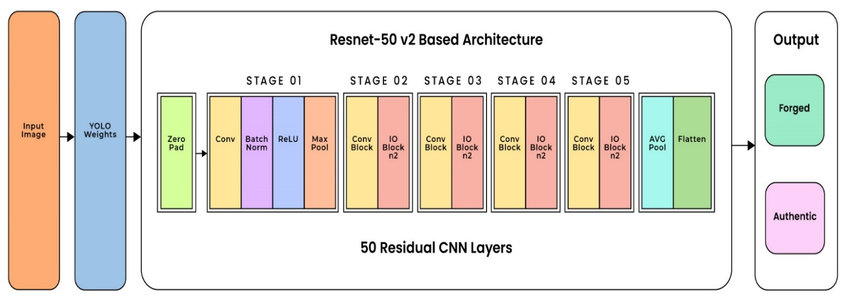

Na sličan način kao što je to urađeno prilikom razmatranja InceptionV3 modela, ulazni podaci su pripremljeni i podeljeni na deo za trening i deo za validaciju. Jedna bitna razliku koju je potrebno odmah primetiti jeste veličina ulaznih slika. Dok je kod InceptionV3 modela korišćena veličina od 299x299 piksela, u ovom kodu se koristi veličina od 224x224 piksela. ResNet50V2 model zahteva ulazne slike fiksne veličine date rezolucije, pa je neophodno prilagoditi veličinu slika u skladu sa tim zahtevom. Takođe, nad slikama su primenjene augmentacije koje sadrže male razlike u vrednosti parametara, kako bi se eksperimentisalo i proverilo kako te promene mogu uticati na performanse modela. Pored toga, povećan je i udeo slika koji se koristi za validaciju, što je u ovom slučaju 15%.

In [33]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
                                   rescale = 1./255,
                                   validation_split = 0.15,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   rotation_range = 20,
                                   brightness_range=[0.2,1.0])

train_set = train_datagen.flow_from_dataframe(train_labels,
                                                directory=train_data,
                                                 x_col = "path",
                                                 y_col = "breed",
                                                 batch_size = 16,
                                                 subset="training",
                                                 class_mode = "categorical",
                                                 target_size = (224,224),
                                                 seed = 42,
                                                 shuffle = True)

validate_set = train_datagen.flow_from_dataframe(train_labels,
                                    directory=train_data,
                                                 x_col = "path",
                                                 y_col = "breed",
                                                 batch_size = 16,
                                                 subset="validation",
                                                 class_mode = "categorical",
                                                 target_size = (224,224),
                                                 seed = 42,
                                                 shuffle = True)

Found 8689 validated image filenames belonging to 120 classes.
Found 1533 validated image filenames belonging to 120 classes.


Na identičan način kao što je to urađeno kod kreiranja InceptionV3 modela,u narednoj ćeliji se kreira model za klasifikaciju korišćenjem prethodno učitanog ResNet50V2 modela. Ovde je prikazan alternativni način kreiranja modela u odnosu na prethodni primer sa InceptionV3 modelom. Glavna razlika je u sintaksi, dok je konceptualni deo sličan. Umesto korišćenja Sequential modela i dodavanja slojeva jedan za drugim, ovde je korišćen funkcionalni pristup. Takođe,može se primetiti da je povećan broj epoha,kako bi se videlo kakav će to uticaj imati na treniranje modela.

In [37]:
resnet50V2 = tf.keras.applications.ResNet50V2(include_top=False,
                                              weights='imagenet',
                                              input_shape=(224, 224, 3))
resnet50V2.trainable = False
for layer in resnet50V2.layers:
    layer.trainable = False

resnet_model = tf.keras.models.Sequential()
resnet_model.add(resnet50V2)
resnet_model.add(tf.keras.layers.Flatten())
resnet_model.add(tf.keras.layers.Dropout(0.4))
resnet_model.add(tf.keras.layers.Dense(256, activation='relu'))
resnet_model.add(tf.keras.layers.Dense(120, activation='softmax'))


resnet_model.compile(loss = 'categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5),
              metrics   = ['accuracy'])

resnet_hist = resnet_model.fit_generator(generator = train_set,
                           epochs = 20,
                           steps_per_epoch  = train_set.n//train_set.batch_size,
                           validation_data  = validate_set,
                           validation_steps = validate_set.n//validate_set.batch_size,
                           callbacks = callbacks_list
                           )

Epoch 1/20
543/543 [==============================] - 230s 366ms/step - loss: 5.1840 - accuracy: 0.0532 - val_loss: 4.0123 - val_accuracy: 0.1441 - lr: 1.0000e-05
Epoch 2/20
543/543 [==============================] - 199s 366ms/step - loss: 3.6741 - accuracy: 0.1979 - val_loss: 2.9795 - val_accuracy: 0.3105 - lr: 1.0000e-05
Epoch 3/20
543/543 [==============================] - 197s 363ms/step - loss: 2.9095 - accuracy: 0.3211 - val_loss: 2.4050 - val_accuracy: 0.4026 - lr: 1.0000e-05
Epoch 4/20
543/543 [==============================] - 183s 337ms/step - loss: 2.4515 - accuracy: 0.4113 - val_loss: 2.1603 - val_accuracy: 0.4671 - lr: 1.0000e-05
Epoch 5/20
543/543 [==============================] - 197s 362ms/step - loss: 2.2110 - accuracy: 0.4561 - val_loss: 2.0402 - val_accuracy: 0.4822 - lr: 1.0000e-05
Epoch 6/20
543/543 [==============================] - 197s 363ms/step - loss: 2.0227 - accuracy: 0.4984 - val_loss: 1.9359 - val_accuracy: 0.5046 - lr: 1.0000e-05
Epoch 7/20
543/543 [==

Naredna ćelija ima za cilj da prikaže metrike treninga i validacije tokom treniranja modela ResNet50V2. Grafovi prikazuju promene gubitka i preciznosti tokom svake epohe treninga i validacije. Na gornjem grafu se prikazuje gubitak. Plava linija predstavlja gubitak tokom treninga, dok zelena linija predstavlja gubitak tokom validacije. Sa druge strane,na donjem grafu se prikazuje preciznost. Plava linija predstavlja preciznost tokom treninga, dok zelena linija predstavlja preciznost tokom validacije. Ovi grafikoni nam pružaju uvid u performanse modela tokom treninga i validacije.

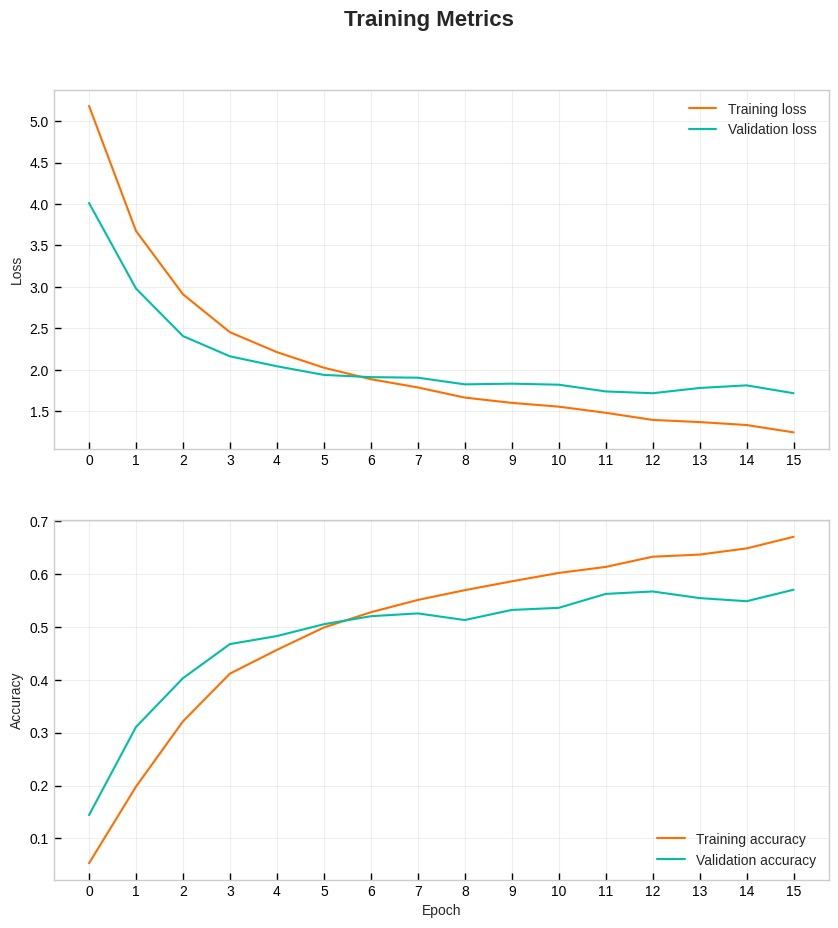

In [39]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

plt.style.use('seaborn-whitegrid')
colors = ['#FF6F00', '#00BFA5']


ax1.plot(resnet_hist.history['loss'], color=colors[0], label="Training loss")
ax1.plot(resnet_hist.history['val_loss'], color=colors[1], label="Validation loss")
ax1.set_xticks(np.arange(0, len(resnet_hist.history['loss']), 1))
ax1.set_ylabel('Loss')
ax1.legend(loc='upper right')

ax2.plot(resnet_hist.history['accuracy'], color=colors[0], label="Training accuracy")
ax2.plot(resnet_hist.history['val_accuracy'], color=colors[1], label="Validation accuracy")
ax2.set_xticks(np.arange(0, len(resnet_hist.history['accuracy']), 1))
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend(loc='lower right')

fig.suptitle('Training Metrics', fontsize=16, fontweight='bold')
plt.subplots_adjust(top=0.9)

ax1.grid(alpha=0.3)
ax2.grid(alpha=0.3)
ax1.tick_params(axis='both', which='both', direction='in', length=5, width=1, colors='black')
ax2.tick_params(axis='both', which='both', direction='in', length=5, width=1, colors='black')

plt.show()

 U narednim ćelijama biće dato poređenje performansi prethodno kreiranih modela.
 U ćeliji ispod se vrši evaluacija modela zasnovanog na InceptionV3 nad validacionim skupom podataka kako bismo dobili gubitak i preciznost modela na tom skupu. Funkcija evaluate_generator se koristi za evaluaciju modela nad generatorom podataka validate_set. Ona izračunava gubitak i preciznost modela nad podacima iz validacionog skupa. Nakon evaluacije, vrednosti gubitka i tačnosti se ispisuju. Vrednost score[0] predstavlja gubitak na validacionom skupu, dok vrednost score[1] predstavlja preciznost na validacionom skupu.

In [43]:
score = model.evaluate_generator(val)
print('Val loss:', score[0])
print('Val accuracy:', score[1])

Val loss: 0.9796904921531677
Val accuracy: 0.7504892349243164


Analogno ćeliji iznad, u narednoj ćeliji se takođe vrši izračunavanje gubitka i preciznosti modela, s tim da se u ovoj ćeliji vrši evaluacija ResNet50V2 modela,s ciljem poređenja performansi.

In [41]:
resnet_score = resnet_model.evaluate_generator(validate_set)
print('Val loss:', resnet_score[0])
print('Val accuracy:', resnet_score[1])

Val loss: 1.7386714220046997
Val accuracy: 0.5714285969734192


U ovoj ćeliji se vrši poređenje performansi prethodno kreiranih modela - InceptionV3 i ResNet50V2. Poređenje se vrši na osnovu prethodno izračunatih preciznosti modela na validacionom skupu podataka.

In [44]:
models_df = pd.DataFrame(data=[["ResNet50V2", float(format(resnet_score[1]))]],
                          columns=['Model', 'Accuracy'])

temp_df = pd.DataFrame(data=[["InceptionV3", float(format(score[1]))]],
                          columns=['Model', 'Accuracy'])
models_df = models_df.append(temp_df, ignore_index=True)

models_df


,Model,Accuracy
0,ResNet50V2,0.571429
1,InceptionV3,0.750489


U narednoj ćeliji se kreira grafikon koji omogućava vizuelno poređenje preciznosti modela ResNet50V2 i InceptionV3, pri čemu će svaki model biti prikazan kao horizontalna traka, a dužina trake će predstavljati njegovu tačnost.

<Axes: ylabel='Model'>

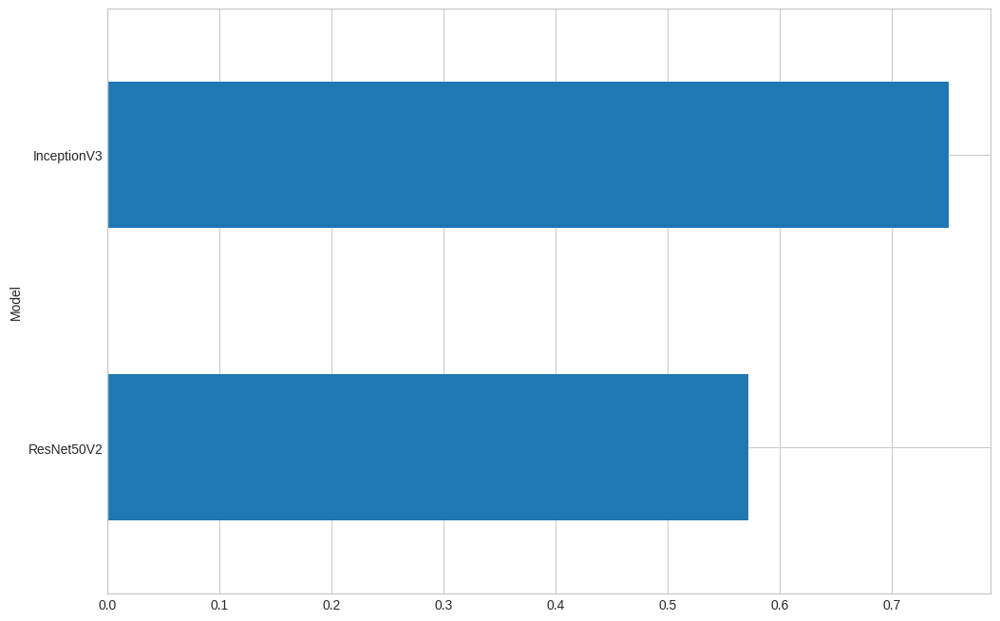

In [45]:
models_df.set_index('Model', inplace=True)
models_df['Accuracy'].plot(kind='barh', figsize=(12, 8))

# Zaključak
Sve faze procesa, uključujući učitavanje podataka, njihovu analizu i pripremu, izgradnja i treniranje izabranih modela, kao i njihovo testiranje i evaluaciju rezultata, su temeljno obuhvaćene u radu. Prilikom izrade projekta, primenjen je transfer learning pristup, koristeći modele InceptionV3 i ResNet50V2. Prednosti korišćenja transfer learninga su mnogobrojne. Prvo, možemo postići dobre performanse čak i sa manjim skupom podataka, jer prethodno trenirani modeli već sadrže opštu slikovnu inteligenciju. Takođe, možemo uštedeti vreme i resurse koji bi bili potrebni za treniranje modela od nule. Takođe primenjena je i augmentacija kako bismo povećali raznolikost podataka i izbegli overfitovanje. Analizom dobijenih rezultata utvrđeno je da se model InceptionV3 bolje pokazao i postigao višu tačnost u klasifikaciji pasa u odnosu na model ResNet50V2. Tačnost modela InceptionV3 na validacionom skupu iznosi 75%, dok je tačnost modela ResNet50V2 iznosila 57%.

Da bi se dodatno dalje poboljšali dobijeni rezultati, moguće je primeniti nekoliko pristupa. Moguće je eksperimentisati s dodatnim slojevima ili promeniti parametre postojećih slojeva u modelima. Može se takođe steći utisak da bi rezultati bili bolji ukoliko bi broj ulaznih podataka bio još veći i bolje prilagođeniji samoj klasifikaciji. Takođe, moguće je izvršiti i  fine-tjuning modela, što znači da bismo odblokirali neke slojeve i omogućili im da se prilagode našim podacima. Dodatno, može se eksperimentisati s različitim vrednostima parametara kod augmentacije ili sa dodavanjem dodatnih augmentacija kako bismo povećali raznolikost podataka.

# Reference
1.InceptionV3 - https://cloud.google.com/tpu/docs/inception-v3-advanced

2.Transfer Learning - https://machinelearningmastery.com/transfer-learning-for-deep-learning/

3.TensorFlow - https://www.tensorflow.org/tutorials

4.Resnet50V2 - https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet_v2/ResNet50V2

5.DataGenerator - https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator